In [ ]:
!pip install git+https://github.com/huggingface/transformers.git


In [ ]:
!pip install accelerate safetensors


In [3]:
!nvidia-smi

Sun Sep  7 19:26:31 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      On  |   00000000:00:03.0 Off |                    0 |
| N/A   47C    P0             28W /   72W |    7427MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [1]:
import os       
import random      
import textwrap   
import io        
import requests    
import numpy as np  

# Deep‑learning stack 
from transformers import AutoModelForCausalLM, AutoTokenizer
from transformers import AutoProcessor, AutoModelForVision2Seq

import torch

# Imaging & visualisation
from PIL import Image                    
import matplotlib.pyplot as plt          
import matplotlib.patches as patches     

         

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model_id = "Qwen/Qwen2.5-VL-3B-Instruct"
processor = AutoProcessor.from_pretrained(model_id)

tokenizer = AutoTokenizer.from_pretrained(model_id, trust_remote_code=True)
model = AutoModelForVision2Seq.from_pretrained(
    model_id,
    device_map="auto",
    dtype=torch.bfloat16
)
print(f"Model loaded on: {model.device}")

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

The image processor of type `Qwen2VLImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. Note that this behavior will be extended to all models in a future release.


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/transformers/models/auto/modeling_auto.py:2244: FutureWarning: The class `AutoModelForVision2Seq` is deprecated and will be removed in v5.0. Please use `AutoModelForImageTextToText` instead.
  warnings.warn(


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Model loaded on: cuda:0


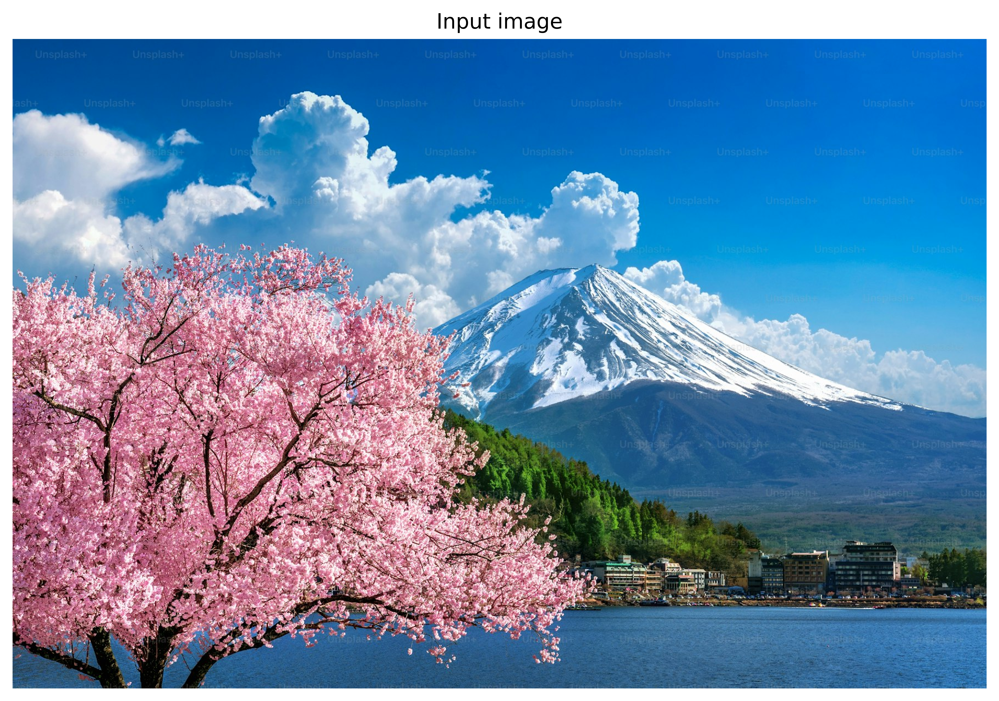

In [3]:
url = "https://plus.unsplash.com/premium_photo-1661964177687-57387c2cbd14?q=80&w=1770&auto=format&fit=crop&ixlib=rb-4.1.0&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D"
img = Image.open(io.BytesIO(requests.get(url, timeout=15).content)).convert("RGB")

# Display the image
plt.figure(figsize=(10,8),dpi=800)
plt.imshow(img)
plt.axis("off")
plt.title("Input image")
plt.show()

In [4]:
msgs = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": img},
            {"type": "text",  "text": "Describe this image."}
        ],
    }
]

In [5]:
text_prompt = processor.apply_chat_template(
    msgs,
    tokenize=False,
    add_generation_prompt=True
)



In [11]:
inputs = processor(text=text_prompt, images=img, return_tensors="pt").to(model.device)

# Generate
with torch.no_grad():
    outputs = model.generate(**inputs, max_new_tokens=1000)

print(processor.decode(outputs[0], skip_special_tokens=True))

system
You are a helpful assistant.
user
Describe this image.
assistant
The image depicts a stunning natural landscape featuring Mount Fuji, a prominent and iconic mountain in Japan. The mountain is covered with snow and has a distinctive conical shape, with its peak reaching high into the sky. In the foreground, there is a large tree with vibrant pink blossoms, likely cherry blossoms, which adds a touch of color and beauty to the scene. The tree is situated near a body of water, possibly a lake or river, which reflects the surrounding scenery. The sky above is clear with a few scattered clouds, enhancing the overall serene and picturesque quality of the image. The background includes lush greenery and some buildings, indicating that this location is likely a popular tourist spot.


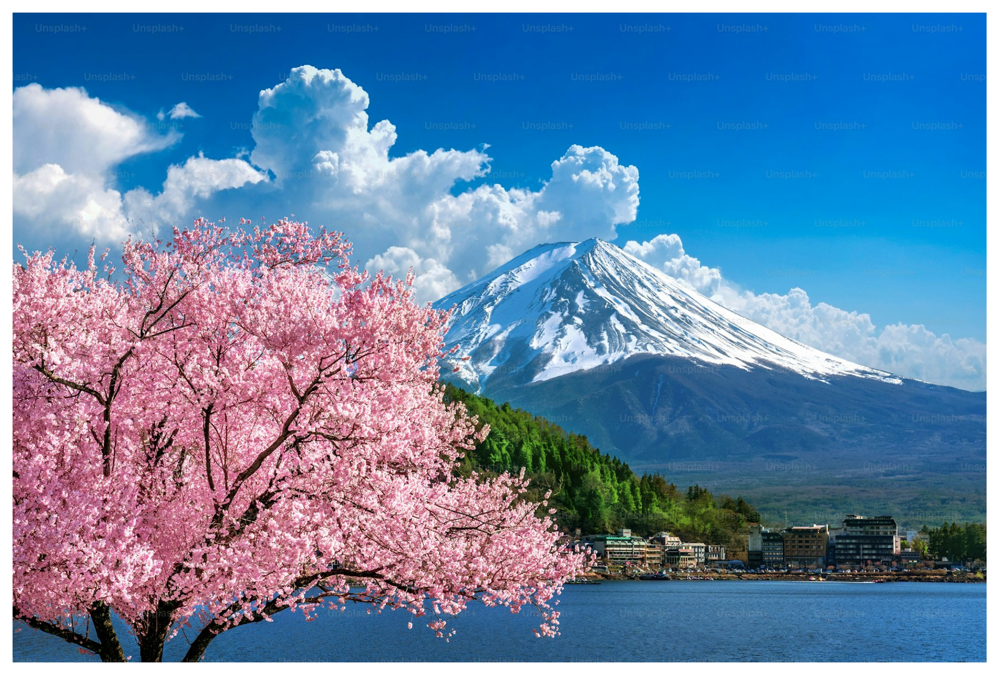

The image depicts a stunning natural landscape featuring Mount Fuji, a prominent
and iconic mountain in Japan. The mountain is covered with snow and has a
distinctive conical shape, with its peak reaching high into the sky. In the
foreground, there is a large tree with vibrant pink blossoms, likely cherry
blossoms, which adds a touch of color and beauty to the scene. The tree is
situated near a body of water, possibly a lake or river, which reflects the
surrounding scenery. The sky above is clear with a few scattered clouds,
enhancing the overall serene and picturesque quality of the image. The
background includes lush greenery and some buildings, indicating that this
location is likely a popular tourist spot.


In [12]:
# Extract generated tokens 
caption = processor.batch_decode(
    outputs[:, inputs.input_ids.shape[-1]:],
    skip_special_tokens=True
)[0]

# Display the image
plt.figure(figsize=(10,8),dpi=800)
plt.imshow(img)
plt.axis("off")
plt.show()

# Print caption
width = 80
wrapped_caption = textwrap.fill(caption, width)
print(wrapped_caption)